## Notebook for WeatherType Classification

In [309]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline

In [310]:
data_filename="weather_classification_data.csv"
normalized_database_filename="normalized_weather_table.db"

In [311]:
import sqlite3
from sqlite3 import Error
import os

# Function to create a database connection
def create_connection(db_file, delete_db=False):
    if delete_db and os.path.exists(db_file):
        os.remove(db_file)

    conn = None
    try:
        conn = sqlite3.connect(db_file)
        conn.execute("PRAGMA foreign_keys = 1")
    except Error as e:
        print(e)

    return conn

# Function to create a table
def create_table(conn, create_table_sql, drop_table_name=None):
    if drop_table_name:
        try:
            c = conn.cursor()
            c.execute(f"DROP TABLE IF EXISTS {drop_table_name}")
        except Error as e:
            print(e)

    try:
        c = conn.cursor()
        c.execute(create_table_sql)
    except Error as e:
        print(e)

# Function to execute a SQL statement
def execute_sql_statement(sql_statement, conn):
    cur = conn.cursor()
    cur.execute(sql_statement)
    rows = cur.fetchall()
    return rows

# Function to insert data into the table
def insert_function(sql, conn, values):
    cur = conn.cursor()
    cur.executemany(sql, values)
    conn.commit()
    return cur.lastrowid

In [312]:
# Create tables for normalized data
def step1_create_tables(normalized_database_filename):
    conn_norm = create_connection(normalized_database_filename, True)

    # Create Location table
    create_location_table_sql = """CREATE TABLE Location (
        LocationID INTEGER PRIMARY KEY AUTOINCREMENT,
        Location TEXT NOT NULL
    );"""
    create_table(conn_norm, create_location_table_sql, "Location")

    # Create WeatherType table
    create_weather_type_table_sql = """CREATE TABLE WeatherType (
        WeatherTypeID INTEGER PRIMARY KEY AUTOINCREMENT,
        WeatherType TEXT NOT NULL
    );"""
    create_table(conn_norm, create_weather_type_table_sql, "WeatherType")

    # Create Season table
    create_season_table_sql = """CREATE TABLE SeasonType (
        SeasonID INTEGER PRIMARY KEY AUTOINCREMENT,
        Season TEXT NOT NULL
    );"""
    create_table(conn_norm, create_season_table_sql, "Season")

    # Create CloudCover table
    create_cloud_cover_table_sql = """CREATE TABLE CloudCover (
        CloudCoverID INTEGER PRIMARY KEY AUTOINCREMENT,
        CloudCoverDescription TEXT NOT NULL
    );"""
    create_table(conn_norm, create_cloud_cover_table_sql, "CloudCover")

    # Create UVIndex table
    create_uv_index_table_sql = """CREATE TABLE UVIndex (
        UVIndexID INTEGER PRIMARY KEY AUTOINCREMENT,
        UVIndex REAL NOT NULL
    );"""
    create_table(conn_norm, create_uv_index_table_sql, "UVIndex")

    # Create Weather table (main table)
    create_weather_table_sql = """CREATE TABLE Weather (
        WeatherID INTEGER PRIMARY KEY AUTOINCREMENT,
        Temperature REAL,
        Humidity REAL,
        WindSpeed REAL,
        Precipitation REAL,
        AtmosphericPressure REAL,
        Visibility REAL,
        LocationID INTEGER,
        WeatherTypeID INTEGER,
        SeasonID INTEGER,
        CloudCoverID INTEGER,
        UVIndexID INTEGER,
        FOREIGN KEY (LocationID) REFERENCES Location (LocationID),
        FOREIGN KEY (WeatherTypeID) REFERENCES WeatherType (WeatherTypeID),
        FOREIGN KEY (SeasonID) REFERENCES Season (SeasonID),
        FOREIGN KEY (CloudCoverID) REFERENCES CloudCover (CloudCoverID),
        FOREIGN KEY (UVIndexID) REFERENCES UVIndex (UVIndexID)
    );"""
    create_table(conn_norm, create_weather_table_sql, "Weather")

    conn_norm.close()


In [313]:
# Function to insert data into the Location table
def insert_location_data(data_filename, normalized_database_filename):
    conn = sqlite3.connect(normalized_database_filename)
    cursor = conn.cursor()

    locations = set()
    with open(data_filename, 'r') as file:
        header = None
        for line in file:
            line = line.strip()
            if not line:
                continue
            if not header:
                header = line
                continue
            values = line.split(',')
            location = values[9]  # Assuming Location is the 9th column (index 8)
            locations.add((location,))

    cursor.executemany("INSERT INTO Location (Location) VALUES (?)", sorted(locations))
    conn.commit()
    conn.close()

In [314]:
# Function to insert data into the WeatherType table
def insert_weather_type_data(data_filename, normalized_database_filename):
    conn = sqlite3.connect(normalized_database_filename)
    cursor = conn.cursor()

    weather_types = set()
    with open(data_filename, 'r') as file:
        header = None
        for line in file:
            line = line.strip()
            if not line:
                continue
            if not header:
                header = line
                continue
            values = line.split(',')
            weather_type = values[10]  # Assuming Weather Type is the 10th column (index 9)
            weather_types.add((weather_type,))

    cursor.executemany("INSERT INTO WeatherType (WeatherType) VALUES (?)", sorted(weather_types))
    conn.commit()
    conn.close()

In [315]:
# Function to insert data into the Season table
def insert_season_data(data_filename, normalized_database_filename):
    conn = sqlite3.connect(normalized_database_filename)
    cursor = conn.cursor()

    seasons = set()
    with open(data_filename, 'r') as file:
        header = None
        for line in file:
            line = line.strip()
            if not line:
                continue
            if not header:
                header = line
                continue
            values = line.split(',')
            season = values[7]  # Assuming Season is the 8th column (index 7)
            seasons.add((season,))

    cursor.executemany("INSERT INTO SeasonType (Season) VALUES (?)", sorted(seasons))
    conn.commit()
    conn.close()


In [316]:
# Function to insert data into the CloudCover table
def insert_cloud_cover_data(data_filename, normalized_database_filename):
    conn = sqlite3.connect(normalized_database_filename)
    cursor = conn.cursor()

    cloud_covers = set()
    with open(data_filename, 'r') as file:
        header = None
        for line in file:
            line = line.strip()
            if not line:
                continue
            if not header:
                header = line
                continue
            values = line.split(',')
            cloud_cover = values[4]  # Assuming Cloud Cover is the 5th column (index 4)
            cloud_covers.add((cloud_cover,))

    cursor.executemany("INSERT INTO CloudCover (CloudCoverDescription) VALUES (?)", sorted(cloud_covers))
    conn.commit()
    conn.close()

In [317]:
# Function to insert data into the UVIndex table
def insert_uv_index_data(data_filename, normalized_database_filename):
    conn = sqlite3.connect(normalized_database_filename)
    cursor = conn.cursor()

    uv_indexes = set()
    with open(data_filename, 'r') as file:
        header = None
        for line in file:
            line = line.strip()
            if not line:
                continue
            if not header:
                header = line
                continue
            values = line.split(',')
            uv_index = float(values[6])  # Assuming UV Index is the 6th column (index 5)
            uv_indexes.add((uv_index,))

    cursor.executemany("INSERT INTO UVIndex (UVIndex) VALUES (?)", sorted(uv_indexes))
    conn.commit()
    conn.close()


In [318]:
step1_create_tables("normalized_weather_table.db")

In [319]:
insert_location_data(data_filename, normalized_database_filename)
insert_weather_type_data(data_filename, normalized_database_filename)
insert_season_data(data_filename, normalized_database_filename)
insert_cloud_cover_data(data_filename, normalized_database_filename)
insert_uv_index_data(data_filename, normalized_database_filename)

In [320]:
# Function to insert data into the Weather table (main data table)
def insert_weather_data(data_filename, normalized_database_filename):
    conn = sqlite3.connect(normalized_database_filename)
    cursor = conn.cursor()

    weather_data = []
    with open(data_filename, 'r') as file:
        header = None
        for line in file:
            line = line.strip()
            if not line:
                continue
            if not header:
                header = line
                continue
            values = line.split(',')
            temperature = float(values[0])  # Temperature (1st column)
            humidity = float(values[1])  # Humidity (2nd column)
            wind_speed = float(values[2])  # Wind Speed (3rd column)
            precipitation = float(values[3])  # Precipitation (4th column)
            cloud_cover = values[4]  # Cloud Cover (5th column)
            atmospheric_pressure = float(values[5])  # Atmospheric Pressure (6th column)
            uv_index = float(values[6])  # UV Index (7th column)
            season = values[7]  # Season (8th column)
            Visibility = values[8]
            location = values[9]  # Location (9th column)
            weather_type = values[10]  # Weather Type (10th column)

            # Get corresponding IDs for categorical data from normalized tables
            location_id = get_id_from_table("Location", "LocationID", "Location", location, conn)
            weather_type_id = get_id_from_table("WeatherType", "WeatherTypeID", "WeatherType", weather_type, conn)
            season_id = get_id_from_table("SeasonType", "SeasonID", "Season", season, conn)
            cloud_cover_id = get_id_from_table("CloudCover", "CloudCoverID", "CloudCoverDescription", cloud_cover, conn)
            uv_index_id = get_id_from_table("UVIndex", "UVIndexID", "UVIndex", uv_index, conn)

            # Append values for insertion into Weather table
            weather_data.append((temperature, humidity, wind_speed, precipitation, atmospheric_pressure,Visibility, location_id, weather_type_id, season_id, cloud_cover_id, uv_index_id))

    cursor.executemany("""
    INSERT INTO Weather (Temperature, Humidity, WindSpeed, Precipitation, AtmosphericPressure,Visibility, LocationID, WeatherTypeID, SeasonID, CloudCoverID, UVIndexID)
    VALUES (?,?,?,?,?,?,?,?,?,?,?)""", weather_data)
    conn.commit()
    conn.close()

# Function to get IDs for categorical values
def get_id_from_table(table_name, id_column, column_name, value, conn):
    cursor = conn.cursor()
    cursor.execute(f"SELECT {id_column} FROM {table_name} WHERE {column_name}=?", (value,))
    result = cursor.fetchone()
    return result[0] if result else None


In [321]:
insert_weather_data(data_filename, normalized_database_filename)

In [322]:
import sqlite3
import pandas as pd

def fetch_data_from_db(normalized_database_filename):
    conn = sqlite3.connect(normalized_database_filename)

    # SQL join query to combine the tables (using example of joined tables)
    sql_statement="""SELECT
    w.Temperature,w.Humidity,w.WindSpeed,w.Precipitation,c.CloudCoverDescription,w.AtmosphericPressure,u.UVIndex,s.Season,w.Visibility,l.Location,t.WeatherType
    FROM
        Weather w
    JOIN
        CloudCover c ON w.CloudCoverID = c.CloudCoverID
    JOIN
        UVIndex u ON w.UVIndexID = u.UVIndexID
    JOIN
        SeasonType s ON w.SeasonID = s.SeasonID
    JOIN
        Location l ON w.LocationID = l.LocationID
    JOIN
        WeatherType t ON w.WeatherTypeID = t.WeatherTypeID;"""

    # Fetching data into a Pandas DataFrame
    df = pd.read_sql_query(sql_statement, conn)

    conn.close()
    return df

In [323]:
df = fetch_data_from_db(normalized_database_filename)

In [324]:
display(df)

,Temperature,Humidity,WindSpeed,Precipitation,CloudCoverDescription,AtmosphericPressure,UVIndex,Season,Visibility,Location,WeatherType
0,14.0,73.0,9.5,82.0,partly cloudy,1010.82,2.0,Winter,3.5,inland,Rainy
1,39.0,96.0,8.5,71.0,partly cloudy,1011.43,7.0,Spring,10.0,inland,Cloudy
2,30.0,64.0,7.0,16.0,clear,1018.72,5.0,Spring,5.5,mountain,Sunny
3,38.0,83.0,1.5,82.0,clear,1026.25,7.0,Spring,1.0,coastal,Sunny
4,27.0,74.0,17.0,66.0,overcast,990.67,1.0,Winter,2.5,mountain,Rainy
...,...,...,...,...,...,...,...,...,...,...,...
13195,10.0,74.0,14.5,71.0,overcast,1003.15,1.0,Summer,1.0,mountain,Rainy
13196,-1.0,76.0,3.5,23.0,cloudy,1067.23,1.0,Winter,6.0,coastal,Snowy
13197,30.0,77.0,5.5,28.0,overcast,1012.69,3.0,Autumn,9.0,coastal,Cloudy
13198,3.0,76.0,10.0,94.0,overcast,984.27,0.0,Winter,2.0,inland,Snowy


In [325]:
#Checking
df2=pd.read_csv(data_filename)
df1=df
import pandas as pd

# Assuming df1 and df2 are the two DataFrames to compare

# Option 1: Reset indexes and ignore column names
df1_sorted = df1.sort_values(by=list(df1.columns)).reset_index(drop=True)
df2_sorted = df2.sort_values(by=list(df2.columns)).reset_index(drop=True)

# Compare the DataFrames after sorting
are_equal = df1_sorted.values.tolist() == df2_sorted.values.tolist()

# Print the result
if are_equal:
    print("The DataFrames have the same data (ignoring column headers).")
else:
    print("The DataFrames have different data.")


The DataFrames have the same data (ignoring column headers).


In [326]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Pandas Profiling Report")

In [327]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

There is no missing values in any columns as the total row cont 13200 matches with entries in each column,
#Also gives Column Names and its datatypes, where 4 columns are categorical columns 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13200 entries, 0 to 13199
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Temperature            13200 non-null  float64
 1   Humidity               13200 non-null  float64
 2   WindSpeed              13200 non-null  float64
 3   Precipitation          13200 non-null  float64
 4   CloudCoverDescription  13200 non-null  object 
 5   AtmosphericPressure    13200 non-null  float64
 6   UVIndex                13200 non-null  float64
 7   Season                 13200 non-null  object 
 8   Visibility             13200 non-null  float64
 9   Location               13200 non-null  object 
 10  WeatherType            13200 non-null  object 
dtypes: float64(7), object(4)
memory usage: 1.1+ MB


In [329]:
categorical_columns =["CloudCoverDescription","Season","Location","WeatherType"]
for coln in categorical_columns:
    df[coln].value_counts()

CloudCoverDescription
overcast         6090
partly cloudy    4560
clear            2139
cloudy            411
Name: count, dtype: int64

Season
Winter    5610
Spring    2598
Autumn    2500
Summer    2492
Name: count, dtype: int64

Location
inland      4816
mountain    4813
coastal     3571
Name: count, dtype: int64

WeatherType
Rainy     3300
Cloudy    3300
Sunny     3300
Snowy     3300
Name: count, dtype: int64

In [330]:
# Summary of Numerical Attributes
df.describe()

,Temperature,Humidity,WindSpeed,Precipitation,AtmosphericPressure,UVIndex,Visibility
count,13200.000000,13200.000000,13200.000000,13200.000000,13200.000000,13200.000000,13200.000000
mean,19.127576,68.710833,9.832197,53.644394,1005.827896,4.005758,5.462917
std,17.386327,20.194248,6.908704,31.946541,37.199589,3.856600,3.371499
min,-25.000000,20.000000,0.000000,0.000000,800.120000,0.000000,0.000000
25%,4.000000,57.000000,5.000000,19.000000,994.800000,1.000000,3.000000
50%,21.000000,70.000000,9.000000,58.000000,1007.650000,3.000000,5.000000
75%,31.000000,84.000000,13.500000,82.000000,1016.772500,7.000000,7.500000
max,109.000000,109.000000,48.500000,109.000000,1199.210000,14.000000,20.000000


array([[<Axes: title={'center': 'Temperature'}>,
        <Axes: title={'center': 'Humidity'}>,
        <Axes: title={'center': 'WindSpeed'}>],
       [<Axes: title={'center': 'Precipitation'}>,
        <Axes: title={'center': 'AtmosphericPressure'}>,
        <Axes: title={'center': 'UVIndex'}>],
       [<Axes: title={'center': 'Visibility'}>, <Axes: >, <Axes: >]],
      dtype=object)

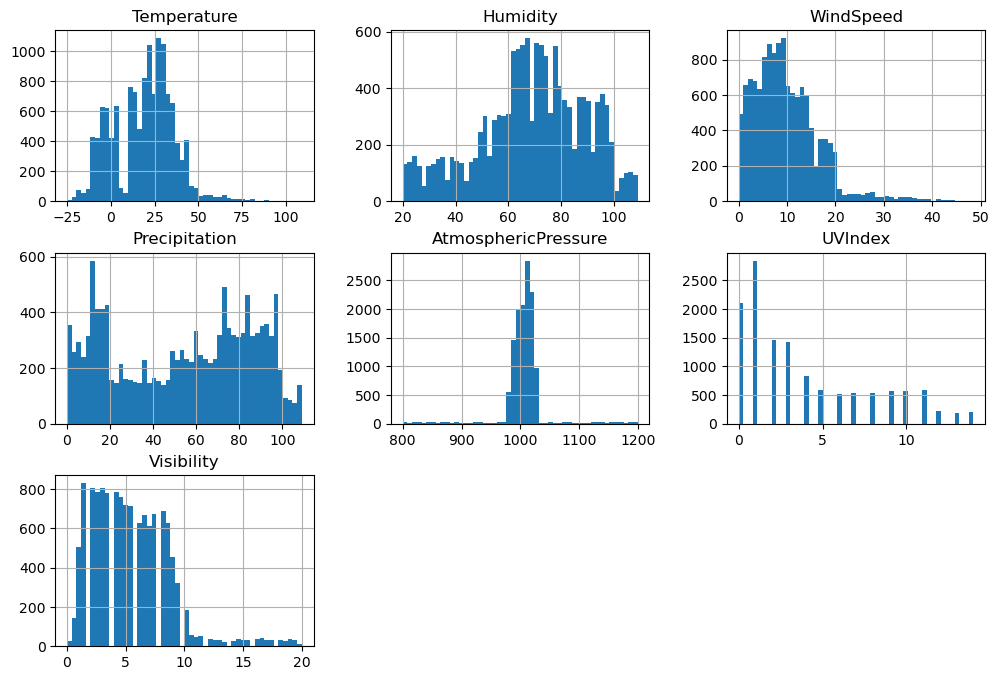

In [331]:
import matplotlib.pyplot as plt

df.hist(bins=50, figsize=(12, 8))
plt.show()

When Not to Apply Log Transformation:
If your data contains non-positive values, like zero or negative values, log transformation should be skipped or an alternative method should be used.
For columns with only positive values and no significant skewness, other preprocessing methods like MinMaxScaler, StandardScaler, or OneHotEncoding might be more appropriate.

In [333]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming `data` is your DataFrame
def check_log_transformation(df):
    features_to_transform = []

    for column in df.columns:
        if df[column].dtype != 'object':  # Skip non-numeric columns
            print(column)
            # Check for log transformation necessity
            if (df[column] > 0).all():  # Ensure no negative or zero values
                log_transformed = np.log1p(df[column])  # Use log1p to avoid zero issues
                # Compare variance before and after transformation
                if np.var(df[column]) > np.var(log_transformed):
                    features_to_transform.append(column)
                else:
                    print(f"{column}: Log transformation not necessary.")
            else:
                print(f"{column}: Contains non-positive values, log transformation skipped.")
    
    return features_to_transform

# Example usage
# Assuming you have a train-test split
# train_df = ... (training dataset)
# test_df = ... (testing dataset)

features_to_log_transform = check_log_transformation(df)
# Train models with log-transformed data
# Example: logistic regression model


Temperature
Temperature: Contains non-positive values, log transformation skipped.
Humidity
WindSpeed
WindSpeed: Contains non-positive values, log transformation skipped.
Precipitation
Precipitation: Contains non-positive values, log transformation skipped.
AtmosphericPressure
UVIndex
UVIndex: Contains non-positive values, log transformation skipped.
Visibility
Visibility: Contains non-positive values, log transformation skipped.


Split the data and possibly stratify!
- We know that Precipitation,Temperature,UVIndex are the most important features so far. Let's split the data into training and testing sets, ensuring that both sets have the same distribution of these categories.

In [335]:
df.head(5)

,Temperature,Humidity,WindSpeed,Precipitation,CloudCoverDescription,AtmosphericPressure,UVIndex,Season,Visibility,Location,WeatherType
0,14.0,73.0,9.5,82.0,partly cloudy,1010.82,2.0,Winter,3.5,inland,Rainy
1,39.0,96.0,8.5,71.0,partly cloudy,1011.43,7.0,Spring,10.0,inland,Cloudy
2,30.0,64.0,7.0,16.0,clear,1018.72,5.0,Spring,5.5,mountain,Sunny
3,38.0,83.0,1.5,82.0,clear,1026.25,7.0,Spring,1.0,coastal,Sunny
4,27.0,74.0,17.0,66.0,overcast,990.67,1.0,Winter,2.5,mountain,Rainy


In [336]:
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


WeatherType distribution in the dataset:
WeatherType
Rainy     3300
Cloudy    3300
Sunny     3300
Snowy     3300
Name: count, dtype: int64


<Axes: xlabel='WeatherType'>

Text(0.5, 0, 'Weather Type')

Text(0, 0.5, 'Number of Observations')

Text(0.5, 1.0, 'Distribution of Weather Type')

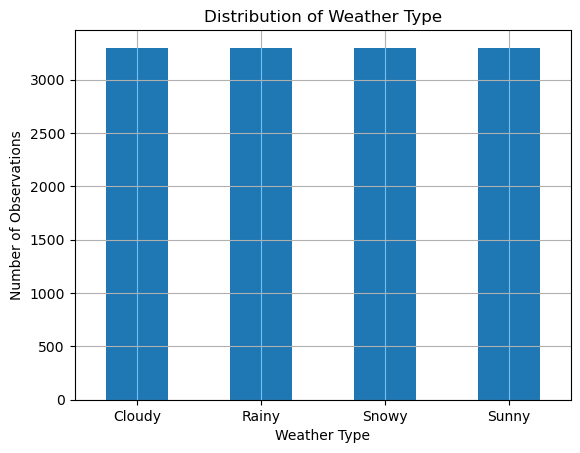

In [337]:
# Check class distribution in the target variable 'WeatherType'
print("\nWeatherType distribution in the dataset:")
print(df["WeatherType"].value_counts())

# Plot the distribution of WeatherType
df["WeatherType"].value_counts().sort_index().plot.bar(rot=0, grid=True)
plt.xlabel("Weather Type")
plt.ylabel("Number of Observations")
plt.title("Distribution of Weather Type")
plt.show()

In [338]:
# Stratify based on WeatherType
strat_train_set, strat_test_set = train_test_split(df, test_size=0.20, stratify=df["WeatherType"], random_state=42)

# Check class distribution in training and testing sets
print("\nWeatherType distribution in training set:")
print(strat_train_set["WeatherType"].value_counts(normalize=True))

print("\nWeatherType distribution in testing set:")
print(strat_test_set["WeatherType"].value_counts(normalize=True))

# Remove any temporary or stratification column if created (not needed here)
# If "income_cat" or similar column was created, drop it as done in your earlier code
# Example: strat_train_set.drop("temp_column", axis=1, inplace=True)

# Verify the train-test split
print("\nTraining set shape:", strat_train_set.shape)
print("Testing set shape:", strat_test_set.shape)

# Copy the training set for further operations
weather_train = strat_train_set.copy()
weather_test = strat_test_set.copy()
print("\nTraining data copy created for further use.")


WeatherType distribution in training set:
WeatherType
Snowy     0.25
Sunny     0.25
Rainy     0.25
Cloudy    0.25
Name: proportion, dtype: float64

WeatherType distribution in testing set:
WeatherType
Rainy     0.25
Cloudy    0.25
Sunny     0.25
Snowy     0.25
Name: proportion, dtype: float64

Training set shape: (10560, 11)
Testing set shape: (2640, 11)

Training data copy created for further use.


Observation from Correlation Matrix
From the correlation Matrix from y-profile, we could see the target variable WeatherType is highly correlated with Temperature, Precipitation.

Temperature,Precipitation,Visibility,CloudCoverDescription,Humidity are most relevant for predicting weatherType.

Season, Windspeed, Location have very low correlation with weatherType, and other features, indicating limited predictive utility.

In [340]:
# Install pandas-profiling if not already installed: pip install ydata-profiling
from ydata_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Generate a profile report for the training data
profile = ProfileReport(weather_train, title="Weather Data Profile", explorative=True)
profile.to_notebook_iframe()  # Displays within a notebook



# Observations and data cleanup tasks
# (Make notes here based on the profile and correlation findings.)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


Training Data Description:
        Temperature      Humidity     WindSpeed  Precipitation  \
count  10560.000000  10560.000000  10560.000000   10560.000000   
mean      19.080682     68.559091      9.882765      53.605398   
std       17.331979     20.173429      6.898173      31.999995   
min      -25.000000     20.000000      0.000000       0.000000   
25%        4.000000     57.000000      5.000000      19.000000   
50%       21.000000     70.000000      9.000000      58.000000   
75%       31.000000     83.000000     13.500000      82.000000   
max      109.000000    109.000000     48.500000     109.000000   

       AtmosphericPressure       UVIndex    Visibility  
count         10560.000000  10560.000000  10560.000000  
mean           1005.656206      4.001042      5.467235  
std              37.313099      3.856884      3.385381  
min             800.230000      0.000000      0.000000  
25%             994.690000      1.000000      3.000000  
50%            1007.620000      3.0

array([[<Axes: title={'center': 'AtmosphericPressure'}>,
        <Axes: title={'center': 'Humidity'}>,
        <Axes: title={'center': 'Temperature'}>],
       [<Axes: title={'center': 'WindSpeed'}>,
        <Axes: title={'center': 'UVIndex'}>,
        <Axes: title={'center': 'Visibility'}>],
       [<Axes: title={'center': 'Precipitation'}>, <Axes: >, <Axes: >]],
      dtype=object)

Text(0.5, 0.98, 'Distribution of Numeric Features')

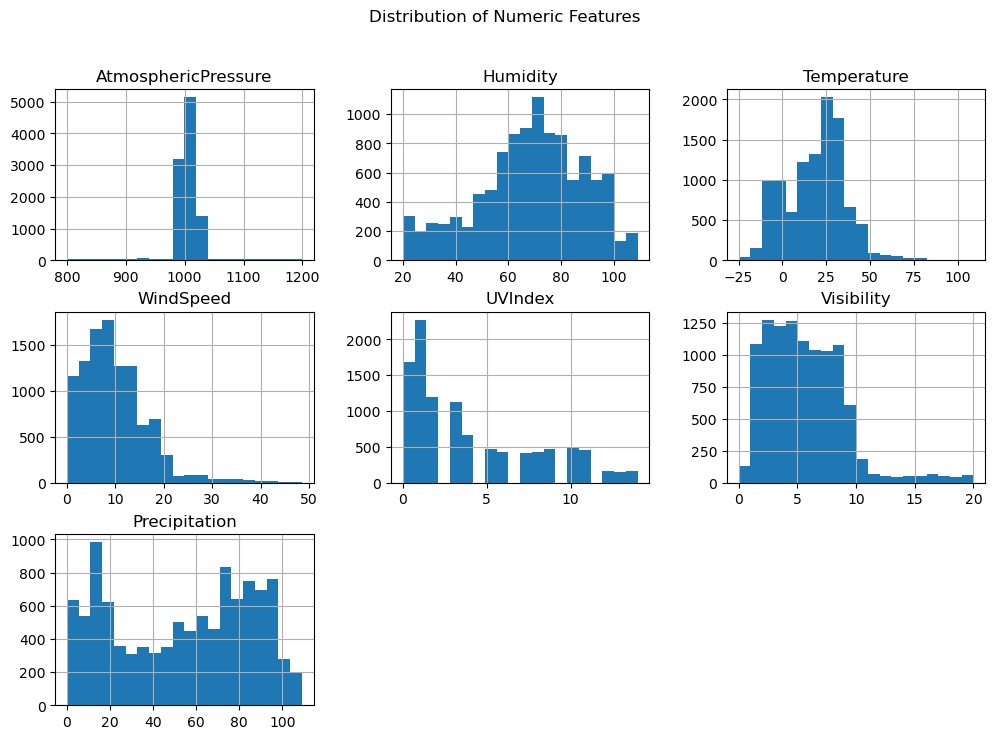


Value Counts for CloudCoverDescription:
CloudCoverDescription
overcast         4876
partly cloudy    3654
clear            1704
cloudy            326
Name: count, dtype: int64


<Axes: xlabel='CloudCoverDescription'>

Text(0.5, 1.0, 'Distribution of CloudCoverDescription')

Text(0.5, 0, 'CloudCoverDescription')

Text(0, 0.5, 'Frequency')

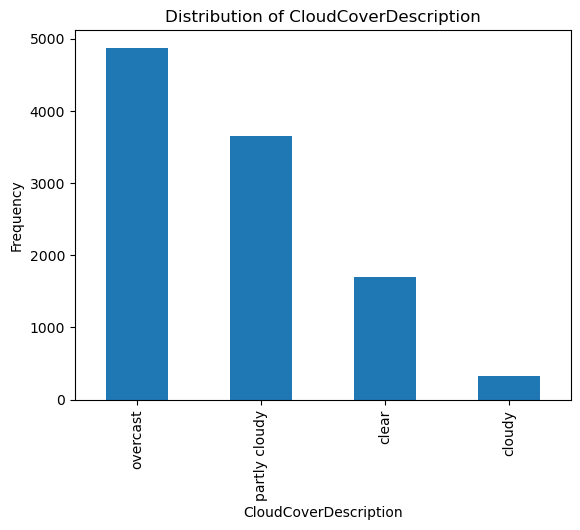


Value Counts for Season:
Season
Winter    4506
Spring    2048
Autumn    2021
Summer    1985
Name: count, dtype: int64


<Axes: xlabel='Season'>

Text(0.5, 1.0, 'Distribution of Season')

Text(0.5, 0, 'Season')

Text(0, 0.5, 'Frequency')

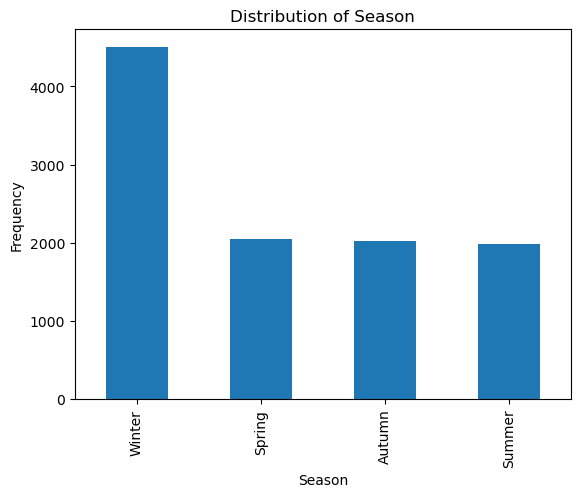


Value Counts for Location:
Location
inland      3856
mountain    3829
coastal     2875
Name: count, dtype: int64


<Axes: xlabel='Location'>

Text(0.5, 1.0, 'Distribution of Location')

Text(0.5, 0, 'Location')

Text(0, 0.5, 'Frequency')

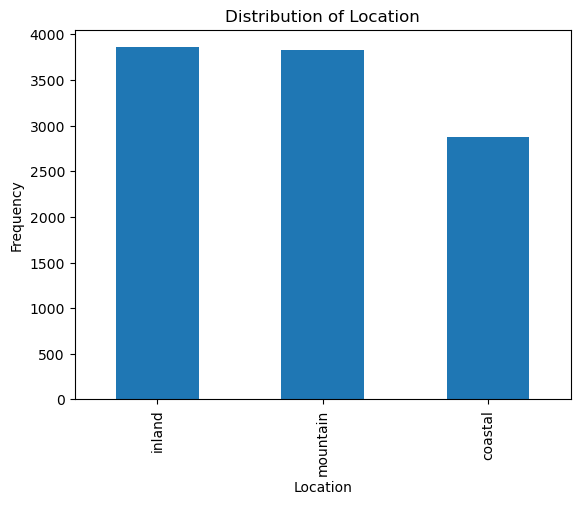


Data Cleanup Tasks:
- Impute missing values if any.
- Scale numeric features (e.g., StandardScaler).
- Encode categorical features using OneHotEncoder.
- Address potential outliers in numeric features (e.g., log transformation).
- Check for capped values in numeric features.


In [341]:
# Observations about features
print("\nTraining Data Description:")
print(weather_train.describe())

# Checking for missing values
missing_values = weather_train.isnull().sum()
print("\nMissing Values in Training Data:")
print(missing_values[missing_values > 0])

# Plotting distributions of numeric features
numeric_features = ["AtmosphericPressure", "Humidity", "Temperature", "WindSpeed", "UVIndex", "Visibility", "Precipitation"]
weather_train[numeric_features].hist(bins=20, figsize=(12, 8))
plt.suptitle("Distribution of Numeric Features")
plt.show()

# Categorical value distributions
categorical_features = ["CloudCoverDescription", "Season", "Location"]
for col in categorical_features:
    print(f"\nValue Counts for {col}:")
    print(weather_train[col].value_counts())
    weather_train[col].value_counts().plot.bar()
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# List of cleanup tasks
print("\nData Cleanup Tasks:")
cleanup_tasks = [
    "Impute missing values if any.",
    "Scale numeric features (e.g., StandardScaler).",
    "Encode categorical features using OneHotEncoder.",
    "Address potential outliers in numeric features (e.g., log transformation).",
    "Check for capped values in numeric features."
]
for task in cleanup_tasks:
    print("- " + task)

The results highlight the performance of your Logistic Regression model during cross-validation and optimization. With 3-fold cross-validation, the model achieved a mean accuracy of 87.1% and a low standard deviation of 0.3%, indicating consistency. For 10-fold cross-validation, the accuracy slightly increased to 87.2%, with a slightly higher variance (1%). Hyperparameter tuning identified the best parameters: a regularization strength of 1, L1 penalty, and the saga solver. The highest accuracy achieved was 87.1% during cross-validation, with a training accuracy of 87.3%.

In [343]:
# Split weather_train into features and target
X_train = weather_train.drop("WeatherType", axis=1)
y_train = weather_train["WeatherType"]

# Split weather_test into features and target
X_test = weather_test.drop("WeatherType", axis=1)
y_test = weather_test["WeatherType"]

# Define feature types
numerical_features = ['Temperature', 'Humidity', 'WindSpeed', 'Precipitation', 'AtmosphericPressure', 'UVIndex', 'Visibility']
categorical_features = ['CloudCoverDescription', 'Season', 'Location']

Key Changes:
Confusion Matrix Logging:

Added confusion_matrix computation for TP (True Positives), TN (True Negatives), FP (False Positives), and FN (False Negatives).
Logged these metrics in MLFlow.
Cross-Validation Mean and Standard Deviation:

Extracted the mean (cv_mean) and standard deviation (cv_std) of F1-scores from GridSearchCV.
Logged these metrics in MLFlow.
Whole Training Data Results:

Computed the F1-score on the training data using the best model.
Logged all metrics related to the training data.
Outputs:
Logged to MLFlow:
Best hyperparameters.
Cross-validation mean and standard deviation of F1-scores.
Training F1-score and confusion matrix components (TP, TN, FP, FN).
The trained logistic regression model.
This ensures all the required metrics and results are available for analysis and comparison.

Experiment #1: Create a pipeline for preprocessing (StandardScaler, MinMaxScaler, LogTransformation, OneHotEncoding) and Logistic Regression. Log F1-score/(TP,TN,FN,FP)  in MLFlow on DagsHub. – Cross validation 3/10 folds. Results—mean/std of CV results and results on the whole training data – add in parameter hyper tuning

In [346]:
#Experiment1
import mlflow
import mlflow.sklearn
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, FunctionTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, confusion_matrix

# Set up MLFlow
MLFLOW_TRACKING_URI = "https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'Indumathitv27'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'a47dfca47f1f5d628277b6598611dcb071281919'
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
mlflow.set_experiment("WeatherType_Classification_Final")

# Define preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('scaled_num', MinMaxScaler(), numerical_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

# Logistic Regression pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter=1000, random_state=42))
])

# Define hyperparameter grid
param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10, 100],
    'classifier__solver': ['lbfgs', 'liblinear']
}

# GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(pipeline, param_grid, cv=3, scoring='f1_weighted', return_train_score=True)

# Train and evaluate
with mlflow.start_run(run_name="WeatherType_LogisticRegression"):
    # Perform grid search
    grid_search.fit(X_train, y_train)
    
    # Best estimator and cross-validation results
    best_model = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    cv_mean = grid_search.best_score_
    cv_std = cv_results['std_test_score'][grid_search.best_index_]

    # Predictions and metrics on the training data
    y_pred_train = best_model.predict(X_train)
    train_f1 = f1_score(y_train, y_pred_train, average='weighted')
    tn, fp, fn, tp = confusion_matrix(y_train, y_pred_train).ravel()[:4]
    
    # Log parameters and metrics
    mlflow.log_param("Best Hyperparameters", grid_search.best_params_)
    mlflow.log_metric("CV Mean F1-Score", cv_mean)
    mlflow.log_metric("CV Std F1-Score", cv_std)
    mlflow.log_metric("Train F1-Score", train_f1)
    mlflow.log_metric("Train True Positives", tp)
    mlflow.log_metric("Train True Negatives", tn)
    mlflow.log_metric("Train False Positives", fp)
    mlflow.log_metric("Train False Negatives", fn)
    
    # Log the trained model
    mlflow.sklearn.log_model(best_model, "LogisticRegressionModel", signature=mlflow.models.infer_signature(X_train, best_model.predict(X_train)))

# Print results
print("Best Hyperparameters:", grid_search.best_params_)
print("CV Mean F1-Score:", cv_mean)
print("CV Std F1-Score:", cv_std)
print("Train F1-Score:", train_f1)
print("Confusion Matrix on Training Data:")
print(f"TP: {tp}, TN: {tn}, FP: {fp}, FN: {fn}")


<Experiment: artifact_location='mlflow-artifacts:/ea34bd5bb85c405f9d0630b4df04817c', creation_time=1734669699470, experiment_id='9', last_update_time=1734669699470, lifecycle_stage='active', name='WeatherType_Classification_Final', tags={}>

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         StandardScaler(),
                                                                         ['Temperature',
                                                                          'Humidity',
                                                                          'WindSpeed',
                                                                          'Precipitation',
                                                                          'AtmosphericPressure',
                                                                          'UVIndex',
                                                                          'Visibility']),
                                                                        ('scaled_num',
                                                                         MinMaxScaler(),
                                                                         ['Temperature',
                                                                          'Humidity',
                                                                          'WindSpeed',
                                                                          'Precipitation',
                                                                          'AtmosphericPressure',
                                                                          'UVIndex',
                                                                          'Visibility']),
                                                                        ('cat',
                                                                         OneHotEncoder(handle_unknown='ignore'),
                                                                         ['CloudCoverDescription',
                                                                          'Season',
                                                                          'Location'])])),
                                       ('classifier',
                                        LogisticRegression(max_iter=1000,
                                                           random_state=42))]),
             param_grid={'classifier__C': [0.01, 0.1, 1, 10, 100],
                         'classifier__solver': ['lbfgs', 'liblinear']},
             return_train_score=True, scoring='f1_weighted')

{'classifier__C': 100, 'classifier__solver': 'lbfgs'}

🏃 View run WeatherType_LogisticRegression at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/9686eaee0cb54852b7cc76cb137069e2
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9
Best Hyperparameters: {'classifier__C': 100, 'classifier__solver': 'lbfgs'}
CV Mean F1-Score: 0.8715684740595343
CV Std F1-Score: 0.002518410798795382
Train F1-Score: 0.8727676215461186
Confusion Matrix on Training Data:
TP: 85, TN: 2196, FP: 272, FN: 87


Experiment #2: Create a pipeline for preprocessing and use LogisticRegression, RidgeClassifier, RandomForestClassifier, and XGBClassifier. Log results in MLFlow on DagsHub.

In [347]:
#experiment2
import os
import numpy as np
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
import mlflow

# Set up MLFlow
MLFLOW_TRACKING_URI = "https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'Indumathitv27'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'a47dfca47f1f5d628277b6598611dcb071281919'
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
mlflow.set_experiment("WeatherType_Classification_Final")

le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)

# Define the log-transform function
def log_transform(x):
    return np.log1p(x)

# Models to train
models = {
    "LogisticRegression": LogisticRegression(),
    "RidgeClassifier": RidgeClassifier(),
    "RandomForestClassifier": RandomForestClassifier(),
    "XGBClassifier": XGBClassifier(),
}

# Loop over models and log results
for model_name, model in models.items():
    # Create pipeline
    pipeline = make_pipeline(preprocessor, model)

    # Cross-validation
    cv_scores = cross_val_score(pipeline, X_train, y_train_encoded, cv=5, scoring="accuracy")
    mean_cv_score = np.mean(cv_scores)
    std_cv_score = np.std(cv_scores)

    # Create a custom run name
    run_name = f"{model_name}"  # You can add more details like timestamp, etc.

    # Log results in MLflow with custom run name
    with mlflow.start_run(run_name=run_name):  # Use the dynamic run_name
        # Log metrics
        mlflow.log_metrics({
            "cv_mean_accuracy": mean_cv_score,
            "cv_std_accuracy": std_cv_score,
        })

        # Log the model with its respective name
        mlflow.sklearn.log_model(
            sk_model=pipeline,
            artifact_path="model_artifacts",
            registered_model_name=model_name,  # Use model_name directly
        )

        print(f"Model {model_name} logged successfully with run name: {run_name}.")

<Experiment: artifact_location='mlflow-artifacts:/ea34bd5bb85c405f9d0630b4df04817c', creation_time=1734669699470, experiment_id='9', last_update_time=1734669699470, lifecycle_stage='active', name='WeatherType_Classification_Final', tags={}>

2024/12/20 00:19:57 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'LogisticRegression' already exists. Creating a new version of this model...
2024/12/20 00:20:06 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LogisticRegression, version 5
Created version '5' of model 'LogisticRegression'.


Model LogisticRegression logged successfully with run name: LogisticRegression.
🏃 View run LogisticRegression at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/3f857a79c99a4f978e9a207acef83c83
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


2024/12/20 00:20:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'RidgeClassifier' already exists. Creating a new version of this model...
2024/12/20 00:20:20 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RidgeClassifier, version 5
Created version '5' of model 'RidgeClassifier'.


Model RidgeClassifier logged successfully with run name: RidgeClassifier.
🏃 View run RidgeClassifier at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/288d4f281ad4474fbe70018a190fd6df
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


2024/12/20 00:20:26 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'RandomForestClassifier' already exists. Creating a new version of this model...
2024/12/20 00:20:34 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RandomForestClassifier, version 5
Created version '5' of model 'RandomForestClassifier'.


Model RandomForestClassifier logged successfully with run name: RandomForestClassifier.
🏃 View run RandomForestClassifier at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/2dc377b7964f4564a33d3d7902c73b26
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


2024/12/20 00:20:39 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'XGBClassifier' already exists. Creating a new version of this model...
2024/12/20 00:20:48 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: XGBClassifier, version 3
Created version '3' of model 'XGBClassifier'.


Model XGBClassifier logged successfully with run name: XGBClassifier.
🏃 View run XGBClassifier at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/6fbc65e6bbd54e299f5baa453237bc27
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


Experiment #3: Perform feature engineering and attribute combination. Log results in MLFlow.

These features were selected because they capture important weather relationships and interactions that directly influence the target variable, WeatherType.

Temp_Precip_Ratio highlights the interplay between temperature and precipitation, revealing patterns like dry or wet conditions, which are strongly correlated with WeatherType.
Humidity_Visibility_Product models the interaction between humidity and visibility, which is key for understanding weather conditions like fog or clear skies.
Both features were chosen based on their strong correlations with WeatherType, domain knowledge about weather patterns, and feature engineering techniques (using ratios and products) to uncover hidden relationships and reduce multicollinearity.

In [350]:
#Experiment3
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from xgboost import XGBClassifier  # Ensure XGBoost is installed
import mlflow
import mlflow.sklearn

# ----- Label Encoding -----
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)  # Encode training labels
y_test_encoded = label_encoder.transform(y_test)        # Encode testing labels

# ----- Feature Engineering -----
X_train['Temp_Precip_Ratio'] = X_train['Temperature'] / (X_train['Precipitation'] + 1e-6)
X_train['Humidity_Visibility_Product'] = X_train['Humidity'] * X_train['Visibility']
X_train['UV_Humidity_Interaction'] = X_train['UVIndex'] * X_train['Humidity']
X_train['Pressure_Season_Interaction'] = X_train['AtmosphericPressure'] * X_train['Season'].map({
    'Winter': 1, 'Spring': 2, 'Summer': 3, 'Autumn': 4  # Encode season for interaction
})

X_test['Temp_Precip_Ratio'] = X_test['Temperature'] / (X_test['Precipitation'] + 1e-6)
X_test['Humidity_Visibility_Product'] = X_test['Humidity'] * X_test['Visibility']
X_test['UV_Humidity_Interaction'] = X_test['UVIndex'] * X_test['Humidity']
X_test['Pressure_Season_Interaction'] = X_test['AtmosphericPressure'] * X_test['Season'].map({
    'Winter': 1, 'Spring': 2, 'Summer': 3, 'Autumn': 4
})

numerical_features.extend(['Temp_Precip_Ratio', 'Humidity_Visibility_Product', 
                           'UV_Humidity_Interaction', 'Pressure_Season_Interaction'])

# ----- Preprocessing Pipeline -----
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)

# ----- Classifiers -----
classifiers = {
    "RandomForestClassifier": RandomForestClassifier(random_state=42),
    "LogisticRegression": LogisticRegression(max_iter=1000, random_state=42),
    "RidgeClassifier": RidgeClassifier(random_state=42),
    "XGBClassifier": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
}

# ----- MLFlow Setup -----
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)
mlflow.set_experiment("WeatherType_Classification_Final")

# ----- Training and Logging -----
for model_name, model in classifiers.items():
    # Define pipeline for the current classifier
    model_pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])
    
    # Start an MLFlow run for the current classifier
    with mlflow.start_run(run_name=f"{model_name}_Experiment3"):
        # Train the model
        model_pipeline.fit(X_train, y_train_encoded)
        
        # Evaluate the model
        y_pred_encoded = model_pipeline.predict(X_test)
        f1 = f1_score(y_test_encoded, y_pred_encoded, average='weighted')
        cm = confusion_matrix(y_test_encoded, y_pred_encoded)
        
        # Log parameters, metrics, and artifacts
        mlflow.log_param("model", model_name)
        mlflow.log_param("feature_engineering", "Temp/Precip ratio, Humidity/Visibility product, UV/Humidity interaction, Pressure/Season interaction")
        mlflow.log_metric("F1 Score", f1)
        
        # Log confusion matrix for multi-class classification
        for i, class_name in enumerate(label_encoder.classes_):
            tp = cm[i, i]  # True Positive for the current class
            fp = cm[:, i].sum() - tp  # False Positive
            fn = cm[i, :].sum() - tp  # False Negative
            tn = cm.sum() - (tp + fp + fn)  # True Negative
            
            # Log these metrics in MLFlow
            mlflow.log_metric(f"{class_name}_True_Positive", tp)
            mlflow.log_metric(f"{class_name}_False_Positive", fp)
            mlflow.log_metric(f"{class_name}_False_Negative", fn)
            mlflow.log_metric(f"{class_name}_True_Negative", tn)

        mlflow.sklearn.log_model(model_pipeline, f"{model_name}_pipeline")
        
        print(f"Experiment with {model_name} completed: Results logged to MLFlow.")

# Decode predictions back to original labels if needed
decoded_predictions = label_encoder.inverse_transform(y_pred_encoded)


<Experiment: artifact_location='mlflow-artifacts:/ea34bd5bb85c405f9d0630b4df04817c', creation_time=1734669699470, experiment_id='9', last_update_time=1734669699470, lifecycle_stage='active', name='WeatherType_Classification_Final', tags={}>

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Temperature', 'Humidity',
                                                   'WindSpeed', 'Precipitation',
                                                   'AtmosphericPressure',
                                                   'UVIndex', 'Visibility',
                                                   'Temp_Precip_Ratio',
                                                   'Humidity_Visibility_Product',
                                                   'UV_Humidity_Interaction',
                                                   'Pressure_Season_Interaction']),
                                                 ('cat', OneHotEncoder(),
                                                  ['CloudCoverDescription',
                                                   'Season', 'Location'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

'RandomForestClassifier'

'Temp/Precip ratio, Humidity/Visibility product, UV/Humidity interaction, Pressure/Season interaction'

2024/12/20 00:21:11 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Experiment with RandomForestClassifier completed: Results logged to MLFlow.
🏃 View run RandomForestClassifier_Experiment3 at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/55d2fa8db1bd4b3fa218427253e408d5
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Temperature', 'Humidity',
                                                   'WindSpeed', 'Precipitation',
                                                   'AtmosphericPressure',
                                                   'UVIndex', 'Visibility',
                                                   'Temp_Precip_Ratio',
                                                   'Humidity_Visibility_Product',
                                                   'UV_Humidity_Interaction',
                                                   'Pressure_Season_Interaction']),
                                                 ('cat', OneHotEncoder(),
                                                  ['CloudCoverDescription',
                                                   'Season', 'Location'])])),
                ('classifier',
                 LogisticRegression(max_iter=1000, random_state=42))])

'LogisticRegression'

'Temp/Precip ratio, Humidity/Visibility product, UV/Humidity interaction, Pressure/Season interaction'

2024/12/20 00:21:55 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Experiment with LogisticRegression completed: Results logged to MLFlow.
🏃 View run LogisticRegression_Experiment3 at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/c48419c35b81462a95ed66e5e70e9a7a
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Temperature', 'Humidity',
                                                   'WindSpeed', 'Precipitation',
                                                   'AtmosphericPressure',
                                                   'UVIndex', 'Visibility',
                                                   'Temp_Precip_Ratio',
                                                   'Humidity_Visibility_Product',
                                                   'UV_Humidity_Interaction',
                                                   'Pressure_Season_Interaction']),
                                                 ('cat', OneHotEncoder(),
                                                  ['CloudCoverDescription',
                                                   'Season', 'Location'])])),
                ('classifier', RidgeClassifier(random_state=42))])

'RidgeClassifier'

'Temp/Precip ratio, Humidity/Visibility product, UV/Humidity interaction, Pressure/Season interaction'

2024/12/20 00:22:24 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Experiment with RidgeClassifier completed: Results logged to MLFlow.
🏃 View run RidgeClassifier_Experiment3 at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/417630c07b0d4343b66ea2dc8e87715b
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [00:22:33] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Temperature', 'Humidity',
                                                   'WindSpeed', 'Precipitation',
                                                   'AtmosphericPressure',
                                                   'UVIndex', 'Visibility',
                                                   'Temp_Precip_Ratio',
                                                   'Humidity_Visibility_Product',
                                                   'UV_Humidity_Interaction',
                                                   'Pressure_Season_Interaction']),
                                                 ('cat', OneHotEncoder(),
                                                  ['CloudCoverDescription',
                                                   'Season...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None,
                               objective='multi:softprob', ...))])

'XGBClassifier'

'Temp/Precip ratio, Humidity/Visibility product, UV/Humidity interaction, Pressure/Season interaction'

2024/12/20 00:22:53 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Experiment with XGBClassifier completed: Results logged to MLFlow.
🏃 View run XGBClassifier_Experiment3 at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/c5f48ce119484dd3b6a34bad83a6cb6e
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


In [401]:
X_train.head(5)

,Temperature,Humidity,WindSpeed,Precipitation,CloudCoverDescription,AtmosphericPressure,UVIndex,Season,Visibility,Location,Temp_Precip_Ratio,Humidity_Visibility_Product,UV_Humidity_Interaction,Pressure_Season_Interaction
13143,-7.0,70.0,1.5,72.0,overcast,989.30,1.0,Winter,2.0,mountain,-0.097222,140.0,70.0,989.30
5670,-2.0,60.0,13.5,75.0,overcast,997.81,1.0,Winter,4.5,mountain,-0.026667,270.0,60.0,997.81
1113,1.0,95.0,4.0,97.0,overcast,987.61,0.0,Winter,3.0,inland,0.010309,285.0,0.0,987.61
2602,20.0,59.0,10.0,16.0,partly cloudy,1015.12,10.0,Summer,9.5,mountain,1.250000,560.5,590.0,3045.36
10526,29.0,32.0,3.0,15.0,clear,1012.12,11.0,Spring,6.0,coastal,1.933333,192.0,352.0,2024.24


Experiment #4: Perform feature selection using Correlation Threshold, Feature Importance, and Variance Threshold. Log results in MLFlow.

In [405]:
import os
import numpy as np
import mlflow
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder

mlflow.set_tracking_uri("https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow")
mlflow.set_experiment("WeatherType_Classification_Final")

# Encode categorical features
label_encoder = LabelEncoder()
X_train_encoded = X_train.copy()

# Encoding categorical features
X_train_encoded['CloudCoverDescription'] = label_encoder.fit_transform(X_train_encoded['CloudCoverDescription'])
X_train_encoded['Season'] = label_encoder.fit_transform(X_train_encoded['Season'])
X_train_encoded['Location'] = label_encoder.fit_transform(X_train_encoded['Location'])

# Feature selection methods
def correlation_threshold(X, threshold=0.9):
    # Compute the correlation matrix and drop features with correlation higher than the threshold
    corr_matrix = X.corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    return X.drop(columns=to_drop), to_drop

def feature_importance(X, y, model=None, threshold=0.01):
    if model is None:
        model = RandomForestClassifier(n_estimators=100)
    model.fit(X, y)
    importances = model.feature_importances_
    important_features = X.columns[importances >= threshold]
    return X[important_features], list(set(X.columns) - set(important_features))

def variance_threshold(X, threshold=0.01):
    selector = VarianceThreshold(threshold=threshold)
    X_new = selector.fit_transform(X)
    selected_columns = X.columns[selector.get_support()]
    return X[selected_columns], list(set(X.columns) - set(selected_columns))

# Log feature selection methods
with mlflow.start_run(run_name="FeatureSelection_Experiment4"):
    
    # 1. Correlation Threshold
    X_corr, dropped_corr = correlation_threshold(X_train_encoded, threshold=0.75)
    mlflow.log_params({"correlation_threshold": 0.75, "dropped_features_corr": dropped_corr})
    
    # 2. Feature Importance
    X_important, dropped_imp = feature_importance(X_train_encoded, y_train, model=RandomForestClassifier(), threshold=0.05)
    mlflow.log_params({"threshold_feature_importance": 0.05, "dropped_features_imp": dropped_imp})
    
    # 3. Variance Threshold
    X_variance, dropped_var = variance_threshold(X_train_encoded, threshold=0.06)
    mlflow.log_params({"variance_threshold": 0.06, "dropped_features_var": dropped_var})
    
    # Cross-validation and accuracy for final selected features (after feature selection)
    def cross_val_accuracy(X, y):
        model = RandomForestClassifier(n_estimators=100)
        return np.mean(cross_val_score(model, X, y, cv=5, scoring='accuracy'))
    
    # Log metrics for all feature selection methods
    mlflow.log_metrics({
        "cv_accuracy_corr": cross_val_accuracy(X_corr, y_train),
        "cv_accuracy_imp": cross_val_accuracy(X_important, y_train),
        "cv_accuracy_var": cross_val_accuracy(X_variance, y_train),
    })
    
    print(f"Logged feature selection and accuracy metrics in MLFlow.")

# Display results
print(f"Dropped Features due to Correlation: {dropped_corr}")
print(f"Dropped Features due to Feature Importance: {dropped_imp}")
print(f"Dropped Features due to Variance Threshold: {dropped_var}")

<Experiment: artifact_location='mlflow-artifacts:/ea34bd5bb85c405f9d0630b4df04817c', creation_time=1734669699470, experiment_id='9', last_update_time=1734669699470, lifecycle_stage='active', name='WeatherType_Classification_Final', tags={}>

Logged feature selection and accuracy metrics in MLFlow.
🏃 View run FeatureSelection_Experiment4 at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/8f23b3e2feba4ab7a2d74ccb9f9a9a1b
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9
Dropped Features due to Correlation: ['Humidity_Visibility_Product', 'UV_Humidity_Interaction', 'Pressure_Season_Interaction']
Dropped Features due to Feature Importance: ['UV_Humidity_Interaction', 'WindSpeed', 'Location', 'Season', 'Humidity', 'Humidity_Visibility_Product']
Dropped Features due to Variance Threshold: []


Experiment #5: Use PCA for dimensionality reduction on all the features. Create a scree plot to show which components will be selected for classification. Log results in MLFlow.

<Experiment: artifact_location='mlflow-artifacts:/ea34bd5bb85c405f9d0630b4df04817c', creation_time=1734669699470, experiment_id='9', last_update_time=1734669699470, lifecycle_stage='active', name='WeatherType_Classification_Final', tags={}>

Selected Principal Components:
   Temperature  Humidity  WindSpeed  Precipitation  CloudCoverDescription  \
0     0.318230 -0.307967  -0.196588      -0.341445              -0.214744   
1     0.187871  0.403225   0.458212       0.364676               0.067473   
2    -0.089703 -0.020359  -0.016181      -0.015413              -0.246401   
3    -0.148146  0.232370  -0.023001       0.109567               0.314169   
4    -0.121050 -0.000093   0.031405       0.025484              -0.046113   

   AtmosphericPressure   UVIndex    Season  Visibility  Location  \
0             0.164372  0.351835 -0.297979    0.370866 -0.125240   
1             0.036160  0.273735 -0.203250   -0.167205 -0.098644   
2            -0.069922  0.402947  0.524336    0.104205  0.130055   
3            -0.119731 -0.159241  0.042520    0.486522  0.032161   
4            -0.405439  0.049595 -0.239572    0.026157  0.762337   

   Temp_Precip_Ratio  Humidity_Visibility_Product  UV_Humidity_Interaction  \
0           0.08318

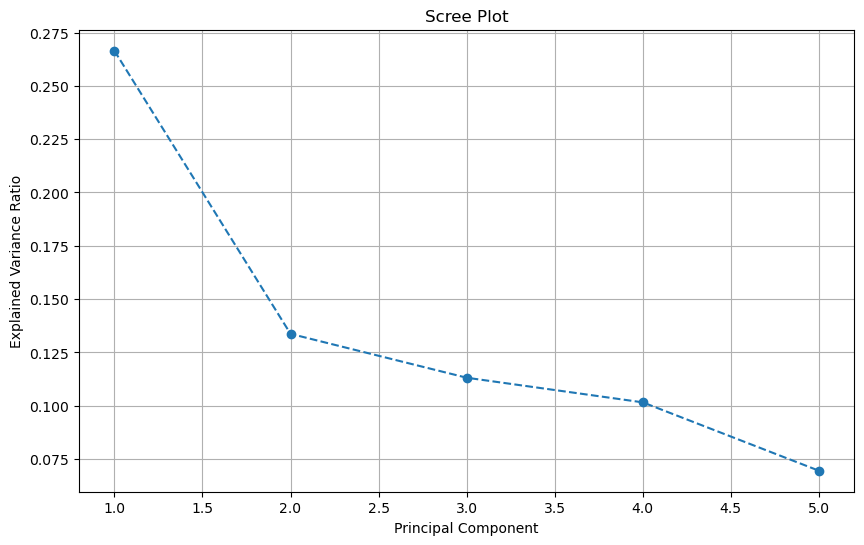

Logged PCA results with 0.8832 accuracy to MLFlow.
🏃 View run PCA_Dimensionality_Reduction at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/7a67e8d3863c4d319316e8f7b1173d8e
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


In [411]:
import os
import numpy as np
import mlflow
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
import matplotlib.pyplot as plt

mlflow.set_tracking_uri("https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow")
mlflow.set_experiment("WeatherType_Classification_Final")

# Preprocessing pipeline (standardization is important for PCA)
scaler = StandardScaler()

# Define PCA transformation
def apply_pca(X, n_components=None):
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X)
    explained_variance_ratio = pca.explained_variance_ratio_
    return X_pca, explained_variance_ratio, pca

# Scree plot to visualize the explained variance
def plot_scree(explained_variance_ratio):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
    plt.title('Scree Plot')
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.grid(True)
    plt.show()

# Log PCA and classification metrics
with mlflow.start_run(run_name="PCA_Dimensionality_Reduction"):
    # Standardize the data before applying PCA
    X_scaled = scaler.fit_transform(X_train_encoded)  # Assuming X_train is already prepared

    # Apply PCA and get explained variance ratio
    X_pca, explained_variance_ratio, pca = apply_pca(X_scaled, n_components=5)  # Choose 5 components or None for all
    
    # Log PCA results
    mlflow.log_params({"n_components": 5, "explained_variance_ratio": explained_variance_ratio.tolist()})
    
    # Print the components selected for classification
    components_df = pd.DataFrame(pca.components_, columns=X_train_encoded.columns)
    print("Selected Principal Components:")
    print(components_df)

    # Create a scree plot
    plot_scree(explained_variance_ratio)

    # Use the transformed data for classification
    model = RandomForestClassifier(n_estimators=100)
    cross_val_score_model = cross_val_score(model, X_pca, y_train, cv=5, scoring='accuracy')
    mean_cv_score = np.mean(cross_val_score_model)
    
    # Log accuracy score
    mlflow.log_metric("cv_accuracy_pca", mean_cv_score)
    
    print(f"Logged PCA results with {mean_cv_score:.4f} accuracy to MLFlow.")


Experiment #6: Design and execute a custom experiment. Log results in MLFlow.

This is a custom Experiment with Feature Selection and RandomForestClassifier
Ensemble Model: The VotingClassifier combines Random Forest, Logistic Regression, SVC, and XGBoost models. This is a simple way to aggregate the predictions from multiple models and might help improve accuracy.

Expected Outcome:
Model Comparison: Compare how the ensemble model performs relative to individual models like Random Forest, Logistic Regression, and XGBoost.


This experiment allows you to explore different strategies to combine models and improve predictions for your weather type classification task while keeping track of everything for comparison.

In [461]:
import mlflow
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score

# Start MLFlow run
with mlflow.start_run(run_name="FeatureSelection_RandomForest_Experiment6"):
    # Feature Selection using SelectKBest (ANOVA F-statistic)
    selector = SelectKBest(score_func=f_classif, k=10)  # Select top 10 features
    X_train_selected = selector.fit_transform(X_train_encoded, y_train)
    selected_features = X_train_encoded.columns[selector.get_support()]

    # Standardize the selected features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_selected)

    # Training RandomForestClassifier
    rf = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=2, random_state=42)  # Example hyperparameters
    rf.fit(X_train_scaled, y_train)

    # Evaluate model
    y_pred = rf.predict(X_train_scaled)
    accuracy = accuracy_score(y_train, y_pred)
    f1 = f1_score(y_train, y_pred, average='weighted')
    
    # Log metrics and model
    mlflow.log_params({
        "k_best_features": 10,
        "rf_n_estimators": rf.n_estimators,
        "rf_max_depth": rf.max_depth,
        "rf_min_samples_split": rf.min_samples_split,
        "rf_random_state": rf.random_state,
    })
    mlflow.log_metric("accuracy", accuracy)
    mlflow.log_metric("f1_score", f1)
    mlflow.sklearn.log_model(rf, "random_forest_model")

    print(f"Custom Experiment complete with Feature Selection and RandomForestClassifier, accuracy: {accuracy}.")

# Results will be logged in MLFlow


RandomForestClassifier(max_depth=10, random_state=42)

2024/12/20 02:19:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Custom Experiment complete with Feature Selection and RandomForestClassifier, accuracy: 0.9830492424242424.
🏃 View run FeatureSelection_RandomForest_Experiment6 at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/8fdcd91b3a724dc3868f3dd968ba1353
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


Custom Ensemble Experiment complete with Voting Classifier

In [459]:
import mlflow
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score

# Start MLFlow run
with mlflow.start_run(run_name="Ensemble_VotingClassifier_Experiment_With_F1"):
    # Preprocessing pipeline
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_encoded)

    # Base classifiers
    rf = RandomForestClassifier(n_estimators=100, max_depth=10, min_samples_split=2)  # Example hyperparameters
    gbc = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3)  # Example hyperparameters
    
    # Ensemble model using Voting Classifier
    voting_clf = VotingClassifier(estimators=[
        ('rf', rf),
        ('gbc', gbc),
    ], voting='soft')
    
    # Fit the model
    voting_clf.fit(X_train_scaled, y_train)

    # Evaluate model
    y_pred = voting_clf.predict(X_train_scaled)
    accuracy = accuracy_score(y_train, y_pred)
    f1 = f1_score(y_train, y_pred, average='weighted')

    # Log metrics and model
    mlflow.log_metric("accuracy", accuracy)
    mlflow.log_metric("f1_score", f1)

    # Log hyperparameters
    mlflow.log_params({
        'rf_n_estimators': rf.n_estimators,
        'rf_max_depth': rf.max_depth,
        'rf_min_samples_split': rf.min_samples_split,
        'gbc_n_estimators': gbc.n_estimators,
        'gbc_learning_rate': gbc.learning_rate,
        'gbc_max_depth': gbc.max_depth,
    })

    mlflow.sklearn.log_model(voting_clf, "voting_classifier_model")

    print(f"Custom Ensemble Experiment complete with Voting Classifier, accuracy: {accuracy}, F1-score: {f1}.")

# Results will be logged in MLFlow


VotingClassifier(estimators=[('rf', RandomForestClassifier(max_depth=10)),
                             ('gbc', GradientBoostingClassifier())],
                 voting='soft')

2024/12/20 02:17:22 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Custom Ensemble Experiment complete with Voting Classifier, accuracy: 0.9755681818181818, F1-score: 0.9756306684644996.
🏃 View run Ensemble_VotingClassifier_Experiment_With_F1 at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9/runs/b00c4951ef09459b91708cb3b2c9fe41
🧪 View experiment at: https://dagshub.com/Indumathitv27/WeatherTypeClassification_FinalProject.mlflow/#/experiments/9


Meaningful F1-score plots to compare experiments and determine the best model.

<Figure size 1000x600 with 0 Axes>

<BarContainer object of 6 artists>

Text(0.5, 1.0, 'F1 Scores for Different Models')

Text(0.5, 0, 'Models')

Text(0, 0.5, 'F1 Score')

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'LogisticRegression'),
  Text(1, 0, 'RidgeClassifier'),
  Text(2, 0, 'RandomForestClassifier'),
  Text(3, 0, 'XGBClassifier'),
  Text(4, 0, 'Ensemble_VotingClassifier'),
  Text(5, 0, 'FeatureSelection_RandomForest')])

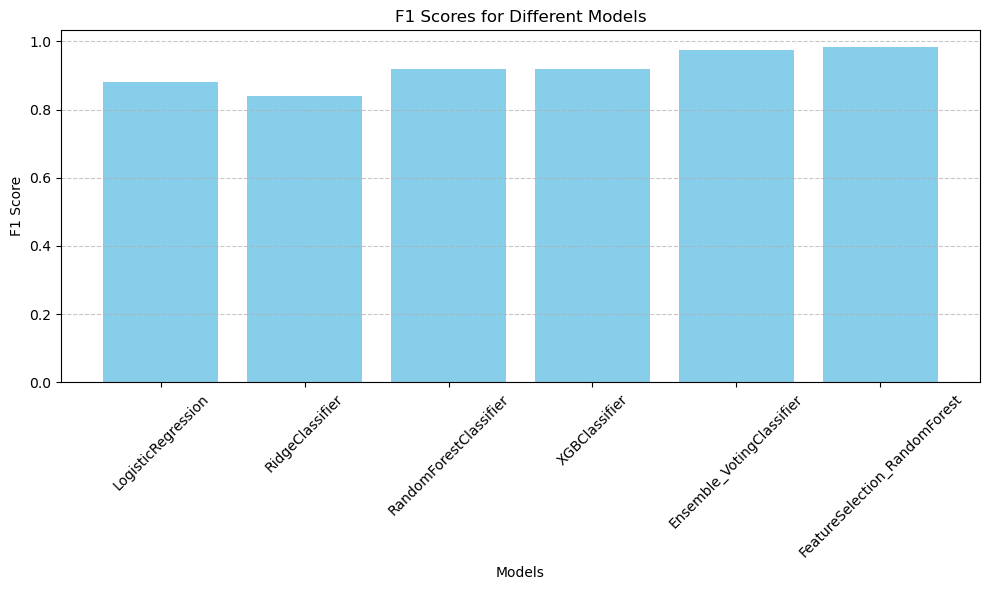

In [463]:
import matplotlib.pyplot as plt

# Example data
models = ['LogisticRegression', 'RidgeClassifier', 'RandomForestClassifier', 'XGBClassifier','Ensemble_VotingClassifier','FeatureSelection_RandomForest']
f1_scores = [0.88, 0.84, 0.92, 0.919, 0.975, 0.983]  # Corresponding F1 scores

# Create bar graph
plt.figure(figsize=(10, 6))
plt.bar(models, f1_scores, color='skyblue')

# Adding title and labels
plt.title('F1 Scores for Different Models')
plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add grid lines for y-axis

# Show plot
plt.tight_layout()  # Adjust layout
plt.show()


Save the final model using joblib.

In [473]:
import pandas as pd
import joblib

# Example: Save model metadata
metadata = {
    'model_name': ['FeatureSelection_RandomForest'],
    'f1_score': [0.983],
    'hyperparameters': ['k_best_features=10,rf_n_estimators=100,rf_max_depth=10,rf_min_samples_split=2,rf_random_state=42']
}
df = pd.DataFrame(metadata)
df.to_csv('model_metadata.csv', index=False)

# Save the model
joblib.dump(model, 'random_forest_model.pkl')

['random_forest_model.pkl']